# gpt-image-1 on Azure AI Foundry - Image Edition

<img src="https://azure.microsoft.com/en-us/blog/wp-content/uploads/2025/04/Azure-AI-ML-Scene-3.png" width=300>

https://azure.microsoft.com/en-us/blog/unveiling-gpt-image-1-rising-to-new-heights-with-image-generation-in-azure-ai-foundry/?msockid=2e39c66c693c66a5151fd200687567d0

Source: https://github.com/Azure-Samples/visionary-lab/tree/main


In [41]:
import base64
import datetime
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math
import os
import re
import requests
import sys
import time

from dotenv import load_dotenv
from io import BytesIO
from openai import AzureOpenAI
from PIL import Image

In [18]:
sys.version

'3.10.14 (main, May  6 2024, 19:42:50) [GCC 11.2.0]'

In [19]:
datetime.datetime.today().strftime('%d %b %Y %H:%M:%S')

'30 Apr 2025 15:21:04'

In [20]:
load_dotenv("azure.env")

api_version = "2025-04-01-preview"

In [21]:
model = "gpt-image-1"

In [22]:
IMAGES_DIR = "images"

In [23]:
RESULTS_DIR = "results"

os.makedirs(RESULTS_DIR, exist_ok=True)

## 1. Edit an image using a text prompt
Edits are currently not supported with the OpenAI Python SDK when using Azure OpenAI. Therefore, we are switching to the REST API.

In [24]:
def image_edit(image_file, prompt, n=1):
    """
    Edits an input image using Azure OpenAI's image editing endpoint based on a given prompt.

    Parameters:
        image_file (str): Path to the image file to be edited.
        prompt (str): Text description that guides how the image should be edited.
        n (int, optional): Number of edited images to generate. Defaults to 1.

    Returns:
        list[str] or None: A list of file paths to the saved edited images if successful,
                           or None if an error occurs during the process.

    The function:
        - Extracts the endpoint base from the Azure OpenAI endpoint environment variable.
        - Sends a request with the input image and prompt to the Azure OpenAI image edits endpoint.
        - Decodes the base64 image data returned in the response.
        - Displays and saves the resulting images to a results directory.
        - Returns the list of file paths to the saved images.
    """
    try:
        # headers
        headers = {"api-key": os.getenv("key")}
        
        # url
        aoai_name = re.search(r'https://(.*?)/openai', os.getenv("endpoint")).group(1)
        url = f"https://{aoai_name}/openai/deployments/{model}/images/edits?api-version=2025-04-01-preview"
        
        # Files
        files = {"image": open(image_file, "rb")}
        
        # data
        data = {
            "prompt": prompt,
            "n": n,
            "size": "1536x1024",  # Options: 1024x1024, 1536x1024, 1024x1536
            "quality": "high",  # high, medium, low
        }

        # Send the request
        response = requests.post(url, headers=headers, files=files, data=data)
        response.raise_for_status()
        # Get the results
        images_data = response.json()["data"]
        encoded_images = [img["b64_json"] for img in images_data]

        # Parsing the generated images
        output_images_list = []

        for encoded_image in encoded_images:
            img = Image.open(BytesIO(base64.b64decode(encoded_image)))
            # Saving image to a file
            fname = os.path.splitext(os.path.basename(image_file))[0]
            now = str(datetime.datetime.today().strftime("%Y%m%d_%H%M%S_%f")[:-3])
            output_file = os.path.join(RESULTS_DIR, f"{fname}_edit_{now}.jpg")
            img.save(output_file)
            print(f"File saved: {output_file}")
            output_images_list.append(output_file)

    except Exception as e:
        print(f"Error generating images: {e}")
        return None

    return output_images_list

### Real initial image

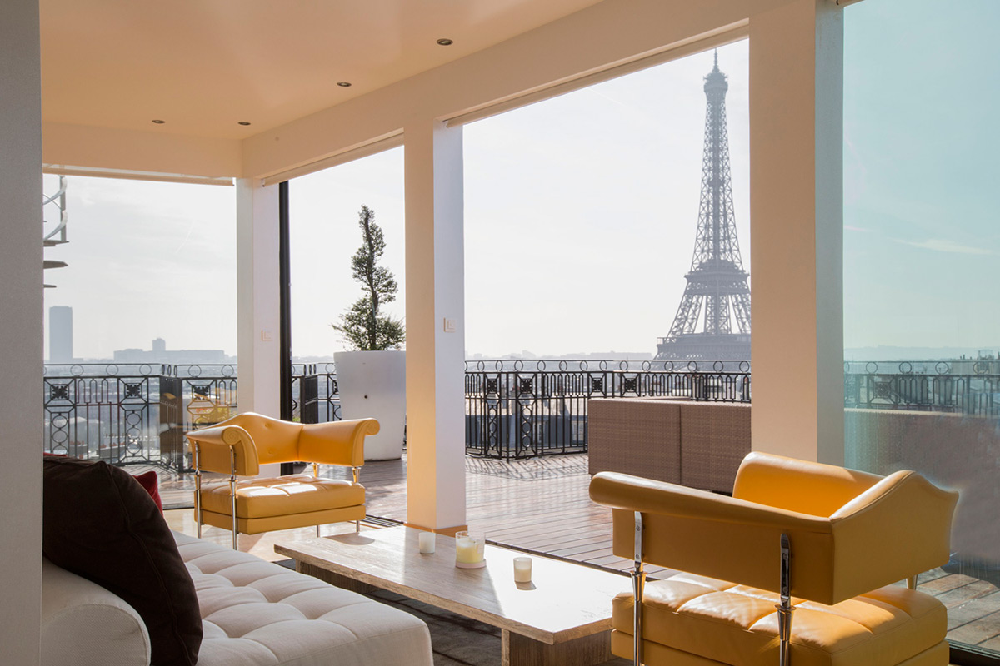

In [9]:
image_file = os.path.join(IMAGES_DIR, "appartment.jpg")

img = Image.open(image_file)
img

### Generated images

File saved: results/appartment_edit_20250429_155937_155.jpg


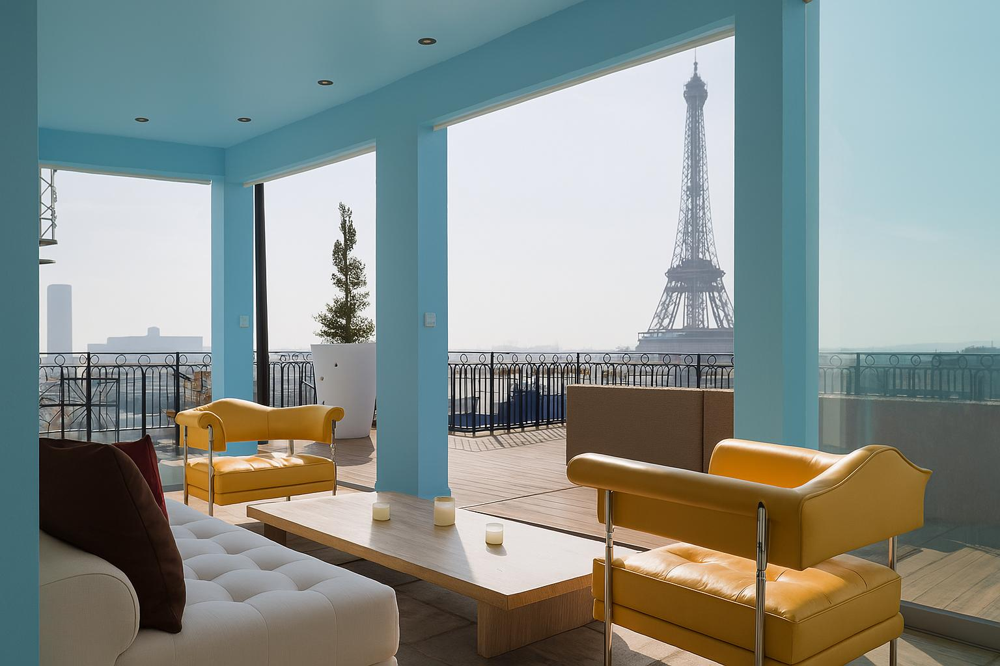

In [10]:
images_list = image_edit(image_file, "Change the color of the walls in light blue", 1)

img = Image.open(images_list[0])
img

File saved: results/appartment_edit_20250429_160049_261.jpg


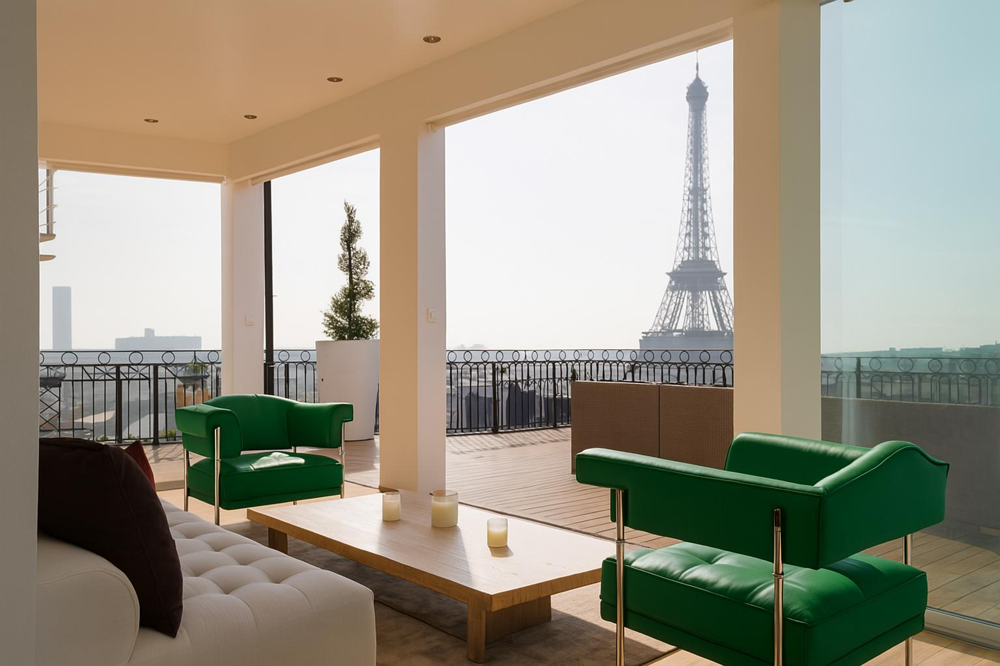

In [11]:
images_list = image_edit(image_file, "Change the color of the chairs in green color", 1)

img = Image.open(images_list[0])
img

File saved: results/appartment_edit_20250429_160158_834.jpg


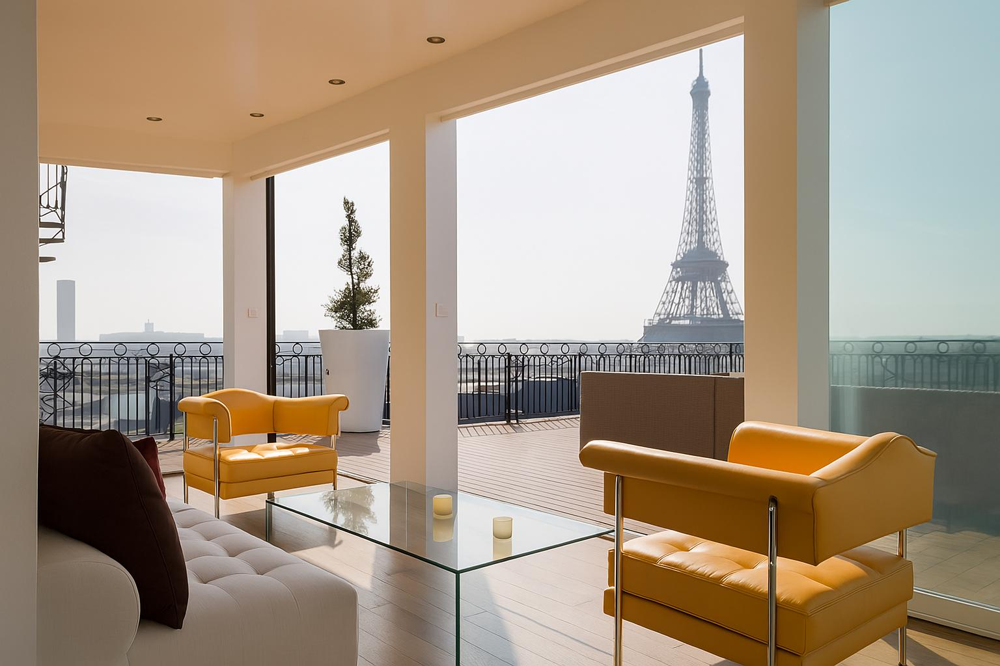

In [12]:
images_list = image_edit(image_file, "Change the table into a glass table", 1)

img = Image.open(images_list[0])
img

File saved: results/appartment_edit_20250429_160342_670.jpg


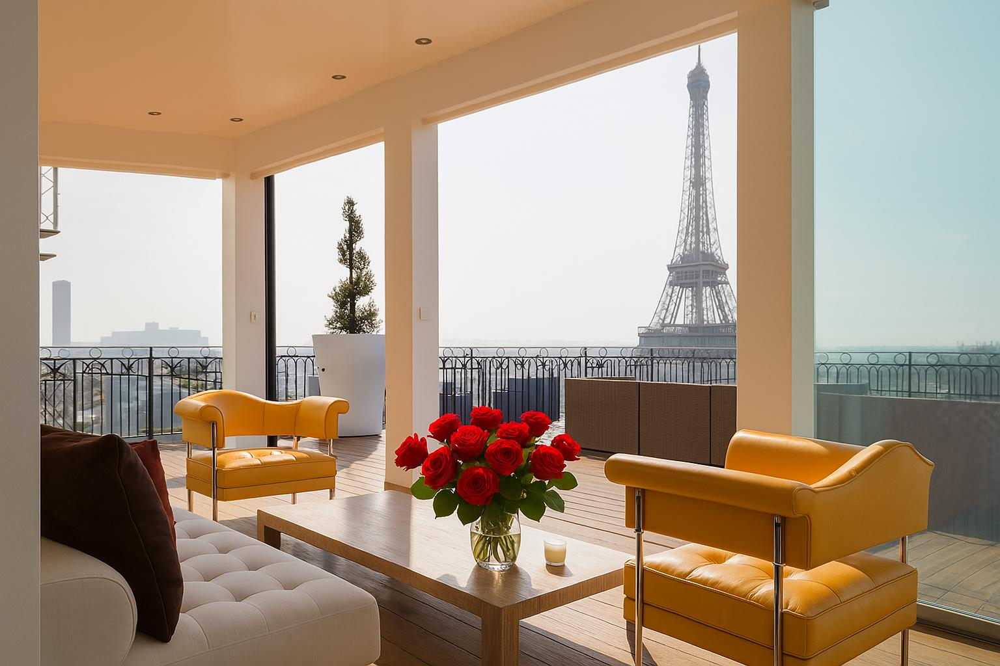

In [13]:
images_list = image_edit(image_file, "Add some roses on the table", 1)

img = Image.open(images_list[0])
img

File saved: results/appartment_edit_20250429_161026_250.jpg


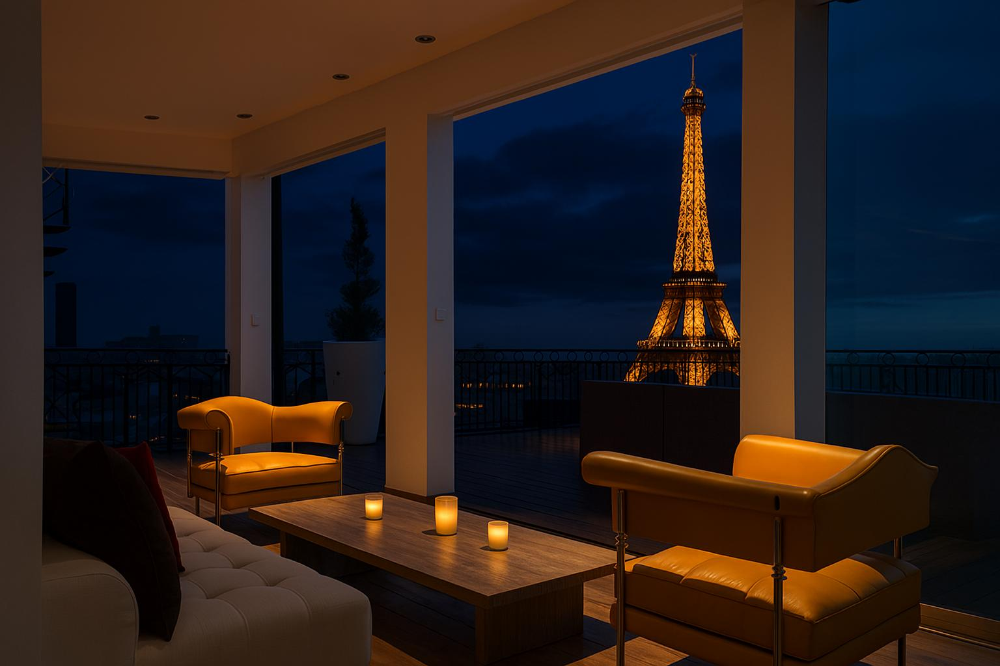

In [15]:
images_list = image_edit(image_file, "Add a darker sky", 1)

img = Image.open(images_list[0])
img

File saved: results/appartment_edit_20250429_161148_738.jpg


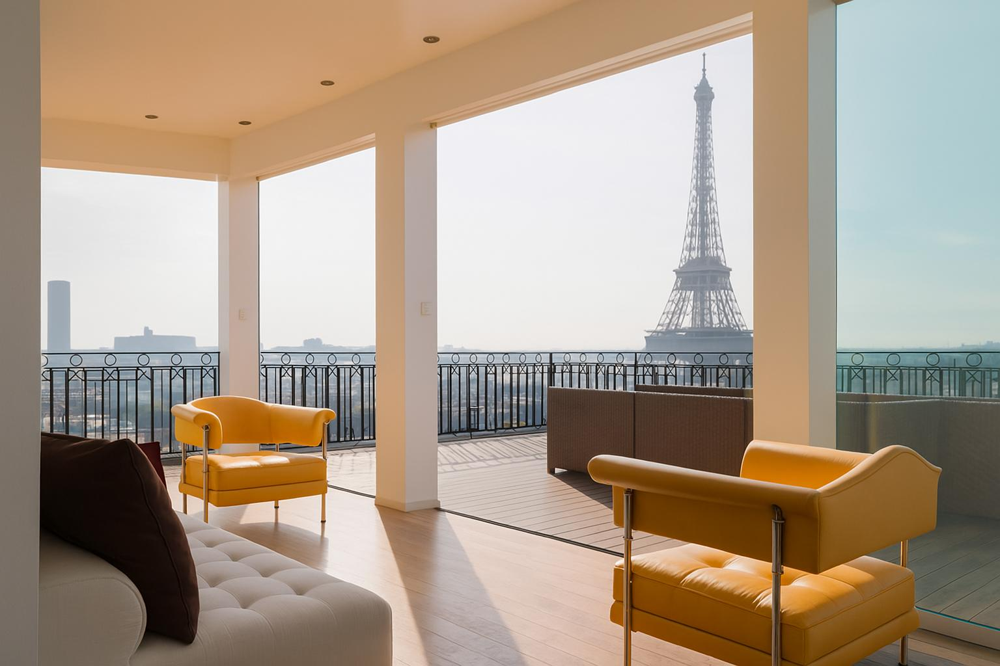

In [16]:
images_list = image_edit(image_file, "Remove the tree on the terrace and the table", 1)

img = Image.open(images_list[0])
img

## Another example

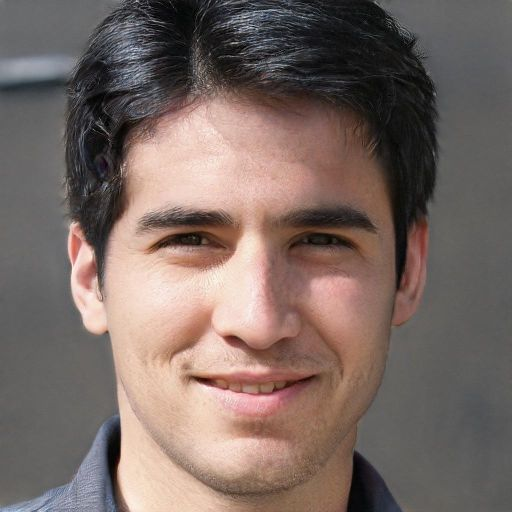

In [35]:
# Note: this initial image is a fake face image
image_file = os.path.join(IMAGES_DIR, "face.jpg")

img = Image.open(image_file)
img

File saved: results/face_edit_20250430_155844_089.jpg


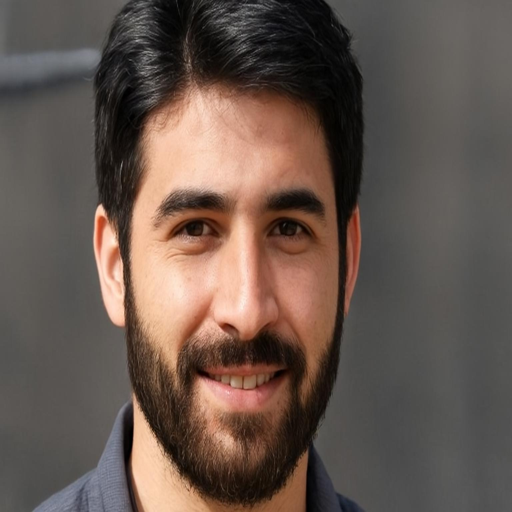

In [36]:
images_list = image_edit(image_file, "Add a beard to the face", 1)

img = Image.open(images_list[0]).resize((512, 512))
img

File saved: results/face_edit_20250430_160003_060.jpg


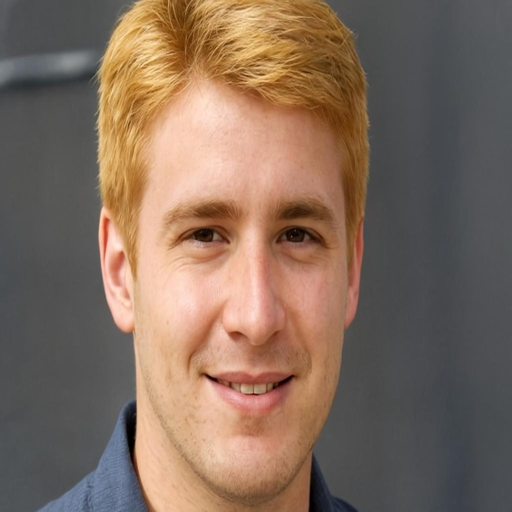

In [37]:
images_list = image_edit(image_file, "Change the color of the hair to blond", 1)

img = Image.open(images_list[0]).resize((512, 512))
img

File saved: results/face_edit_20250430_160118_712.jpg


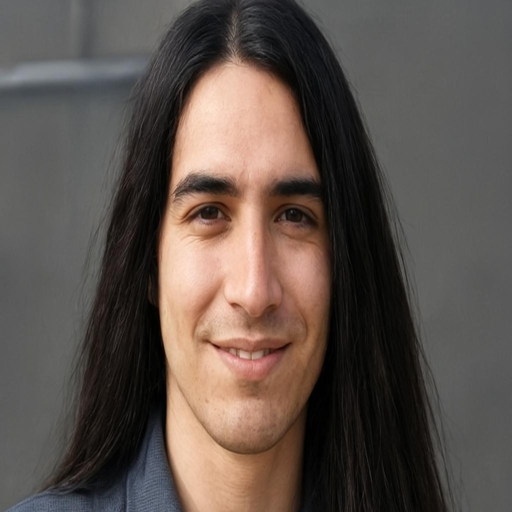

In [38]:
images_list = image_edit(image_file, "Change the hair to long dark hair", 1)

img = Image.open(images_list[0]).resize((512, 512))
img

File saved: results/face_edit_20250430_160237_188.jpg


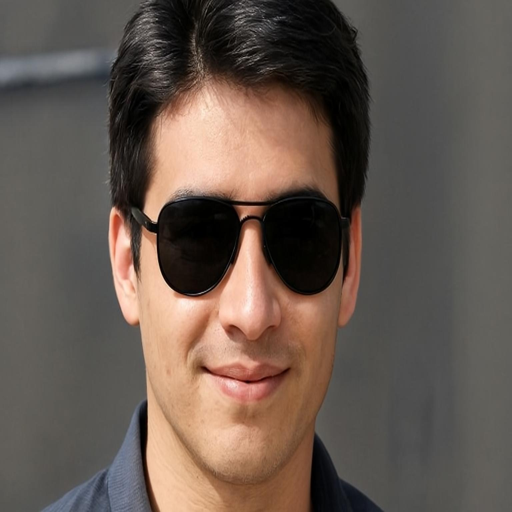

In [39]:
images_list = image_edit(image_file, "Add sunglasses to the face", 1)

img = Image.open(images_list[0]).resize((512, 512))
img

File saved: results/face_edit_20250430_160352_260.jpg


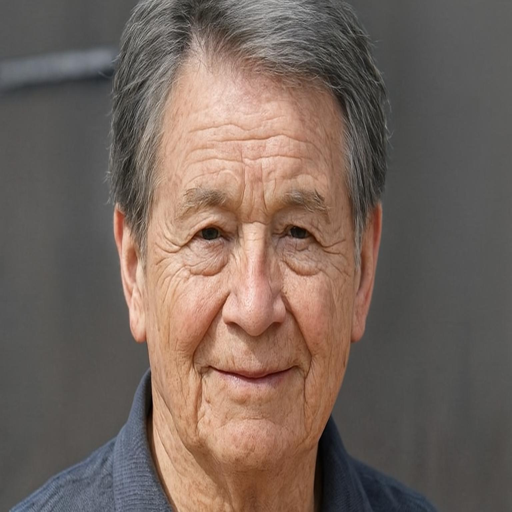

In [40]:
images_list = image_edit(image_file, "Make the face looks like 70 years old", 1)

img = Image.open(images_list[0]).resize((512, 512))
img

### All generated faces images

In [51]:
def display_images(RESULTS_DIR, num_cols=3, img_extensions=(".png", ".jpg", ".jpeg")):
    """
    Display all images from a directory that start with 'face_' in a grid.

    Parameters:
        dir_path (str): Path to the directory containing the images.
        num_cols (int): Number of images per row.
        img_extensions (tuple): Allowed image file extensions.
    """
    # Filter files
    images = [f for f in os.listdir(RESULTS_DIR) 
              if f.startswith("face_") and f.lower().endswith(img_extensions)]
    
    if not images:
        print("No 'face_' images found in the directory.")
        return

    # Full paths
    image_paths = [os.path.join(RESULTS_DIR, img) for img in images]

    num_images = len(image_paths)
    num_rows = math.ceil(num_images / num_cols)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten() if num_images > 1 else [axes]

    for idx, ax in enumerate(axes):
        if idx < num_images:
            img = mpimg.imread(image_paths[idx])
            ax.imshow(img)
            ax.axis('off')
        else:
            ax.axis('off')  # Hide unused subplots

    plt.tight_layout()
    plt.show()


Initial image


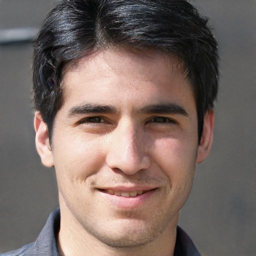

In [55]:
image_file = os.path.join(IMAGES_DIR, "face.jpg")

print("Initial image")
img = Image.open(image_file).resize((256, 256))
img

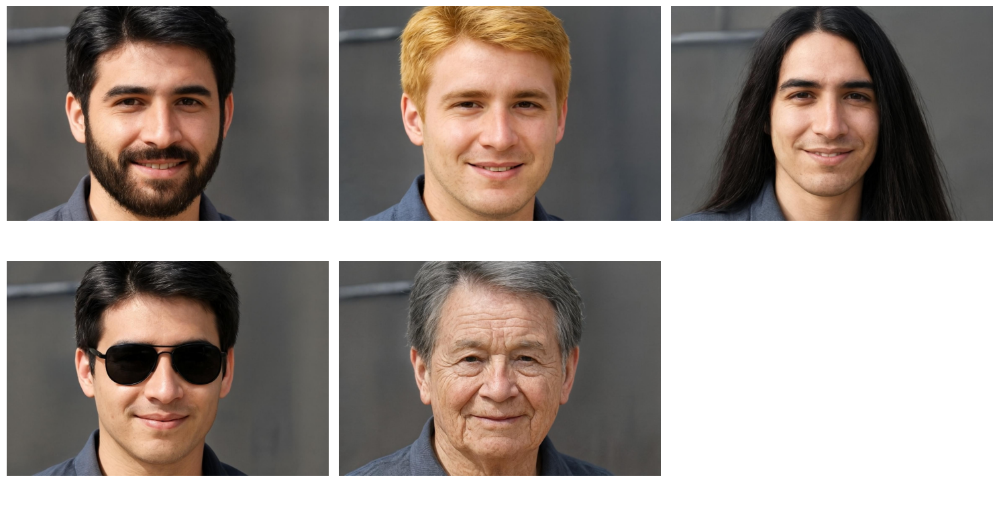

In [56]:
display_images(RESULTS_DIR, num_cols=3)